In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(11.7,8.27)})
pd.options.display.float_format = '{:20,.2f}'.format
import warnings
warnings.simplefilter("ignore")

from sklearn.feature_extraction.text import TfidfVectorizer
import pyLDAvis
import pyLDAvis.gensim_models
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora
from gensim.models import LdaModel
from gensim import matutils

In [2]:
data = pd.read_csv('./processed_text_almazov_natasha.csv')

In [3]:
data.head()

,Регистрационный номер,Номер эпизода,ФИО специалиста,Дата время выполнения,processed_text
0,6612/A19,13654/А2019,Гордеева Мария Сергеевна,2019-03-06 15:00:00.000,режим нагрузка общий рекомендация контроль дав...
1,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,режим нагрузка общий рекомендация ограничение ...
2,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,пищевой волокно день предпочтительно овощ фрук...
3,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,день порция фрукт
4,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,день порция рыба раз неделя приём жирный рыба ...


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63747 entries, 0 to 63746
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Регистрационный номер  63747 non-null  object
 1   Номер эпизода          40850 non-null  object
 2   ФИО специалиста        63747 non-null  object
 3   Дата время выполнения  63747 non-null  object
 4   processed_text         63747 non-null  object
dtypes: object(5)
memory usage: 2.4+ MB


## Topic modeling

In [5]:
# Подготовка токенизированного текста
tokenized_texts = data['processed_text'].apply(lambda x: x.split()).tolist()

In [6]:
# 1. Векторизация текста (TF-IDF)
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)
tfidf_matrix = vectorizer.fit_transform(data['processed_text'])

In [7]:
# 2. Функция для визуализации pyLDAvis
def visualize_topics(lda_model, corpus, dictionary, num_topics):
    """
    Visualizes topics using pyLDAvis for a given number of topics.
    """
    print(f'----------Topics number: {num_topics}----------')
    pyLDAvis.enable_notebook()
    panel = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
    pyLDAvis.display(panel)

In [8]:
# 3. Функция для анализа когерентности и визуализации
def analyze_topics(data, tfidf_matrix, vectorizer, k_range):
    """
    Analyzes coherence and visualizes topics for each k value.
    """
    dictionary = corpora.Dictionary(data['processed_text'].apply(lambda x: x.split()))
    corpus = [dictionary.doc2bow(text.split()) for text in data['processed_text']]
    
    # Checking the dimensions
    print("Corpus size:", len(corpus))
    print("Dictionary size:", len(dictionary))
    
    coherence_values = []
    
    # Cycle by number of topics
    for num_topics in k_range:
        print(f"LDA training for {num_topics} topics...")
        # We train the model directly in the loop
        lda_model = LdaModel(
            corpus=corpus,
            id2word=dictionary,
            num_topics=num_topics,
            random_state=42,
            passes=10,
            iterations=100,
            alpha='auto'
        )
        
        # Calculating coherence
        coherencemodel = CoherenceModel(
            model=lda_model,
            texts=tokenized_texts,
            dictionary=dictionary,
            coherence='c_v'
        )
        coherence_score = coherencemodel.get_coherence()
        coherence_values.append((num_topics, coherence_score))
        
        # Visualizing themes
        visualize_topics(lda_model, corpus, dictionary, num_topics)
    
    # Visualization of the coherence graph
    x = [k for k in k_range]
    y = [k[1] for k in coherence_values]
    plt.figure(figsize=(10, 6))
    plt.plot(x, y, marker='o')
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence Score")
    plt.title("Dependence of coherence on the number of topics")
    plt.grid(True)
    plt.show()
    
    # Print all coherence values
    for num_topics, score in coherence_values:
        print(f"Num Topics: {num_topics}, Coherence Score: {score:.4f}")

Corpus size: 63747
Dictionary size: 3576
LDA training for 2 topics...
----------Topics number: 2----------
LDA training for 3 topics...
----------Topics number: 3----------
LDA training for 4 topics...
----------Topics number: 4----------
LDA training for 5 topics...
----------Topics number: 5----------
LDA training for 6 topics...
----------Topics number: 6----------
LDA training for 7 topics...
----------Topics number: 7----------
LDA training for 8 topics...
----------Topics number: 8----------
LDA training for 9 topics...
----------Topics number: 9----------
LDA training for 10 topics...
----------Topics number: 10----------
LDA training for 11 topics...
----------Topics number: 11----------
LDA training for 12 topics...
----------Topics number: 12----------
LDA training for 13 topics...
----------Topics number: 13----------
LDA training for 14 topics...
----------Topics number: 14----------
LDA training for 15 topics...
----------Topics number: 15----------
LDA training for 16 top

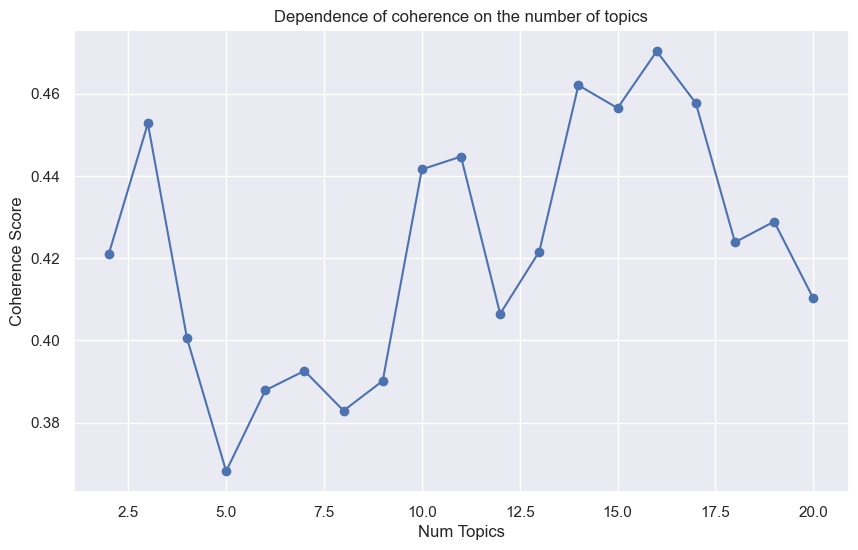

Num Topics: 2, Coherence Score: 0.4210
Num Topics: 3, Coherence Score: 0.4528
Num Topics: 4, Coherence Score: 0.4005
Num Topics: 5, Coherence Score: 0.3682
Num Topics: 6, Coherence Score: 0.3878
Num Topics: 7, Coherence Score: 0.3926
Num Topics: 8, Coherence Score: 0.3829
Num Topics: 9, Coherence Score: 0.3901
Num Topics: 10, Coherence Score: 0.4416
Num Topics: 11, Coherence Score: 0.4447
Num Topics: 12, Coherence Score: 0.4065
Num Topics: 13, Coherence Score: 0.4216
Num Topics: 14, Coherence Score: 0.4621
Num Topics: 15, Coherence Score: 0.4565
Num Topics: 16, Coherence Score: 0.4703
Num Topics: 17, Coherence Score: 0.4577
Num Topics: 18, Coherence Score: 0.4239
Num Topics: 19, Coherence Score: 0.4289
Num Topics: 20, Coherence Score: 0.4102


In [9]:
# 4. Calling the analysis function
k_range = range(2, 21)
analyze_topics(data, tfidf_matrix, vectorizer, k_range)

## Применение LDA

In [10]:
# Obtain a dictionary and a corpus
dictionary = corpora.Dictionary(data['processed_text'].apply(lambda x: x.split()))
corpus = [dictionary.doc2bow(text.split()) for text in data['processed_text']]

In [11]:
# Training an LDA model with a fixed number of topics
num_topics = 11
lda_model = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=num_topics,
    random_state=42,
    passes=10,
    iterations=100,
    alpha='auto'
)

# pyLDAvis visualization of the final model
pyLDAvis.enable_notebook()
panel = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
pyLDAvis.display(panel)

In [12]:
# Function for assigning a dominant theme
def get_dominant_topic(text, lda_model, dictionary):
    text_bow = dictionary.doc2bow(text.split())
    topic_probabilities = lda_model.get_document_topics(text_bow)
    dominant_topic = max(topic_probabilities, key=lambda item: item[1])[0]
    return dominant_topic

In [13]:
# Assigning a dominant theme
data['dominant_topic'] = data['processed_text'].apply(lambda x: get_dominant_topic(x, lda_model, dictionary))

In [14]:
# Function to get top words for each topic
def get_topic_top_words(lda_model, num_words=10):
    topic_words = {}
    for topic_id in range(lda_model.num_topics):
        top_words = [word for word, prob in lda_model.show_topic(topic_id, topn=num_words)]
        topic_words[topic_id] = top_words
    return topic_words

In [15]:
# Create a dictionary of correspondence between topic numbers and top words
topic_top_words = get_topic_top_words(lda_model)

In [16]:
# Display matching topics
print("Соответствие тем:")
for topic_id, words in topic_top_words.items():
    print(f"Тема {topic_id} (LDA, начиная с 0): {words}")

Соответствие тем:
Тема 0 (LDA, начиная с 0): ['ад', 'день', 'пульс', 'раз', 'контроль', 'дневник', 'мм', 'рт', 'ст', 'завтрак']
Тема 1 (LDA, начиная с 0): ['неделя', 'умеренный', 'нагрузка', 'физический', 'динамический', 'аэробный', 'менее', 'день', 'регулярный', 'минута']
Тема 2 (LDA, начиная с 0): ['самоконтроль', 'давление', 'артериальный', 'электронный', 'вес', 'ведение', 'снижение', 'условие', 'дневник', 'домашний']
Тема 3 (LDA, начиная с 0): ['физический', 'упражнение', 'дозированные', 'мина', 'нагрузка', 'ежедневно', 'аэробный', 'активность', 'регулярный', 'ходьба']
Тема 4 (LDA, начиная с 0): ['отдых', 'труд', 'режим', 'нормализация', 'тело', 'масса', 'кг', 'менее', 'индекс', 'курение']
Тема 5 (LDA, начиная с 0): ['темп', 'день', 'ходьба', 'врач', 'ежедневный', 'визит', 'размеренный', 'принести', 'мина', 'тренировка']
Тема 6 (LDA, начиная с 0): ['снижение', 'стрессовый', 'нагрузка', 'мг', 'ситуация', 'аналог', 'либо', 'приём', 'моксонидин', 'вода']
Тема 7 (LDA, начиная с 0): ['ц

In [17]:
# Распределение тем
print(data['dominant_topic'].value_counts())

dominant_topic
10    11704
8      9542
4      6706
3      5845
6      5488
0      5309
1      4861
7      4646
9      4403
2      3237
5      2006
Name: count, dtype: int64


## Clustering

In [18]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import plotly.express as px
import umap

In [19]:
def find_optimal_eps(matrix, n_neighbors=5, plot=False):
    """
    Finds the optimal eps value for DBSCAN using the elbow method.
    """
    neighbors = NearestNeighbors(n_neighbors=n_neighbors)
    neighbors_fit = neighbors.fit(matrix)
    distances, indices = neighbors_fit.kneighbors(matrix)
    distances = np.sort(distances[:, 1], axis=0)
    
    # Ищем "локоть"
    diffs = np.diff(distances)
    try:
        optimal_index = np.argmax(diffs)
        optimal_eps = distances[optimal_index]
        
        if optimal_eps <= 0:
            # If optimal eps = 0, take the 5th percentile of distances
            optimal_eps = np.percentile(distances[distances > 0], 5) if np.any(distances > 0) else 0.1
            
        if optimal_eps < 1e-6:
            optimal_eps = 0.1  # Default value
            
    except ValueError:
        optimal_eps = 0.5  # Backup value
    
    # Visualization of distance graph (optional)
    if plot:
        plt.figure(figsize=(8, 4))
        plt.plot(distances)
        plt.axhline(y=optimal_eps, color='r', linestyle='--', label=f'eps={optimal_eps:.4f}')
        plt.xlabel("Sorted points")
        plt.ylabel(f"Distance to {n_neighbors} neighbor")
        plt.title("Elbow method for selecting eps (DBSCAN)")
        plt.legend()
        plt.grid(True)
        plt.show()
    
    return optimal_eps

In [20]:
# Функция для расчета диаметра кластера
def calculate_cluster_diameter(matrix, cluster_labels, cluster_id):
    """
    Calculates the cluster diameter (maximum distance between points) for the given cluster_id.
    """
    cluster_indices = np.where(cluster_labels == cluster_id)[0]
    if len(cluster_indices) < 2:
        return 0.0  # If there are less than 2 points in a cluster, diameter = 0
    
    cluster_points = matrix[cluster_indices]
    distances = []
    for i in range(len(cluster_points)):
        for j in range(i + 1, len(cluster_points)):
            dist = np.linalg.norm(cluster_points[i] - cluster_points[j])
            distances.append(dist)
    return max(distances) if distances else 0.0

In [21]:
# Function for vectorization and clustering within a topic using DBSCAN
def cluster_within_topic(data, topic_id, global_tfidf_matrix=None):
    """
    Vectorizes and clusters data within a given topic using DBSCAN.
    Returns a TF-IDF matrix, cluster labels, and a subset of the data.
    """
    topic_df = data[data['dominant_topic'] == topic_id]
    if len(topic_df) <= 1:
        return None
    
    # Vectorization
    if global_tfidf_matrix is None:
        vectorizer_topic = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)
        tfidf_matrix_topic = vectorizer_topic.fit_transform(topic_df['processed_text'])
    else:
        indices = topic_df.index
        tfidf_matrix_topic = global_tfidf_matrix[indices]
    
    # We are looking for the optimal value of eps
    optimal_eps = find_optimal_eps(tfidf_matrix_topic.toarray(), plot=True)
    
    # Clustering with DBSCAN
    dbscan = DBSCAN(eps=optimal_eps, min_samples=3)
    cluster_labels = dbscan.fit_predict(tfidf_matrix_topic)
    
    # Checking if clusters have been created
    if len(np.unique(cluster_labels)) <= 1 and np.unique(cluster_labels)[0] == -1:
        return None
    
    # Clustering quality assessment (silhouette coefficient, excluding noise)
    non_noise_indices = cluster_labels != -1
    if np.sum(non_noise_indices) > 1 and len(np.unique(cluster_labels[non_noise_indices])) > 1:
        silhouette = silhouette_score(tfidf_matrix_topic[non_noise_indices], cluster_labels[non_noise_indices])
        print(f"Silhouette score for topic {topic_id}: {silhouette:.4f}")
    
    return tfidf_matrix_topic, cluster_labels, topic_df

In [22]:
# Function for visualizing clustering
def visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="tsne"):
    """
    Снижает размерность (t-SNE или UMAP) и визуализирует кластеры с диаметрами.
    """
    # Selecting a dimensionality reduction method
    if method.lower() == "tsne":
        tsne = TSNE(n_components=3, random_state=42, perplexity=min(5, len(topic_df) - 1))
        reduced_matrix = tsne.fit_transform(tfidf_matrix_topic.toarray())
        dim1, dim2, dim3 = "TSNE Dimension 1", "TSNE Dimension 2", "TSNE Dimension 3"
    else:  # UMAP
        reducer = umap.UMAP(n_components=3, random_state=42, n_neighbors=5, min_dist=0.1, n_jobs=-1)
        reduced_matrix = reducer.fit_transform(tfidf_matrix_topic.toarray())
        dim1, dim2, dim3 = "UMAP Dimension 1", "UMAP Dimension 2", "UMAP Dimension 3"
    
    # Create a DataFrame for visualization
    vis_df = pd.DataFrame({
        dim1: reduced_matrix[:, 0],
        dim2: reduced_matrix[:, 1],
        dim3: reduced_matrix[:, 2],
        'Cluster': cluster_labels
    }, index=topic_df.index)
    
    # We calculate the diameters for each cluster
    unique_clusters = np.unique(cluster_labels)
    cluster_diameters = {}
    for cluster_id in unique_clusters:
        if cluster_id != -1:  # Исключаем шум
            diameter = calculate_cluster_diameter(reduced_matrix, cluster_labels, cluster_id)
            cluster_diameters[cluster_id] = diameter
            print(f"Topic {topic_id}, Cluster {cluster_id}: Diameter = {diameter:.4f}")
    
    # Adding diameters to the visualization
    annotations = []
    for cluster_id, diameter in cluster_diameters.items():
        cluster_center = vis_df[vis_df['Cluster'] == cluster_id].mean()
        annotations.append(
            dict(
                x=cluster_center[dim1],
                y=cluster_center[dim2],
                z=cluster_center[dim3],
                text=f"Cluster {cluster_id}<br>Diameter: {diameter:.4f}",
                showarrow=True,
                arrowhead=2
            )
        )
    
    # Visualization with Plotly Express
    fig = px.scatter_3d(
        vis_df,
        x=dim1,
        y=dim2,
        z=dim3,
        color='Cluster',
        title=f'Clustering (DBSCAN) for topic {topic_id} ({method.upper()})',
        color_discrete_sequence=px.colors.qualitative.Dark24
    )
    fig.update_layout(scene=dict(annotations=annotations))
#     fig.write_html(f"cluster_topic_{topic_id}_{method.lower()}.html")
    fig.show()

In [23]:
# Apply clustering to each topic, save labels, and visualize
# Create columns for all topics in advance
for topic_id in range(num_topics):
    data[f'cluster_topic_{topic_id}'] = np.nan

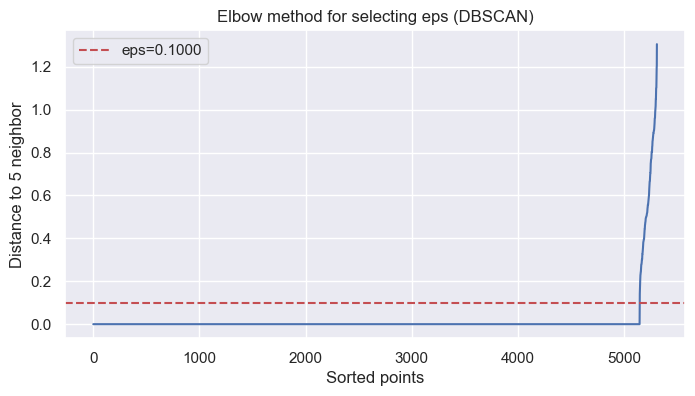

Silhouette score for topic 0: 1.0000
Topic 0, Cluster 0: Diameter = 2.6828
Topic 0, Cluster 1: Diameter = 3.6741
Topic 0, Cluster 2: Diameter = 12.8479
Topic 0, Cluster 3: Diameter = 0.0000
Topic 0, Cluster 4: Diameter = 2002.3783
Topic 0, Cluster 5: Diameter = 0.0000
Topic 0, Cluster 6: Diameter = 9.3445
Topic 0, Cluster 7: Diameter = 9.7777
Topic 0, Cluster 8: Diameter = 2.1408
Topic 0, Cluster 9: Diameter = 0.0000
Topic 0, Cluster 10: Diameter = 2.5017
Topic 0, Cluster 11: Diameter = 0.0000
Topic 0, Cluster 12: Diameter = 9.4530
Topic 0, Cluster 13: Diameter = 0.0000
Topic 0, Cluster 14: Diameter = 2.2516
Topic 0, Cluster 15: Diameter = 3.8464
Topic 0, Cluster 16: Diameter = 11.8206
Topic 0, Cluster 17: Diameter = 0.0000
Topic 0, Cluster 18: Diameter = 3.2464
Topic 0, Cluster 19: Diameter = 0.0000
Topic 0, Cluster 20: Diameter = 0.0000
Topic 0, Cluster 21: Diameter = 8.7782
Topic 0, Cluster 22: Diameter = 8.9260
Topic 0, Cluster 23: Diameter = 7.2709
Topic 0, Cluster 24: Diameter = 

Topic 0, Cluster 0: Diameter = 0.0211
Topic 0, Cluster 1: Diameter = 0.0690
Topic 0, Cluster 2: Diameter = 2.7896
Topic 0, Cluster 3: Diameter = 8.8193
Topic 0, Cluster 4: Diameter = 25.4647
Topic 0, Cluster 5: Diameter = 0.0510
Topic 0, Cluster 6: Diameter = 0.0945
Topic 0, Cluster 7: Diameter = 0.2719
Topic 0, Cluster 8: Diameter = 0.0018
Topic 0, Cluster 9: Diameter = 0.0003
Topic 0, Cluster 10: Diameter = 0.0007
Topic 0, Cluster 11: Diameter = 0.0022
Topic 0, Cluster 12: Diameter = 9.8105
Topic 0, Cluster 13: Diameter = 0.0052
Topic 0, Cluster 14: Diameter = 0.0313
Topic 0, Cluster 15: Diameter = 0.0977
Topic 0, Cluster 16: Diameter = 0.9451
Topic 0, Cluster 17: Diameter = 19.3658
Topic 0, Cluster 18: Diameter = 0.0008
Topic 0, Cluster 19: Diameter = 0.0929
Topic 0, Cluster 20: Diameter = 18.9151
Topic 0, Cluster 21: Diameter = 1.0673
Topic 0, Cluster 22: Diameter = 0.5391
Topic 0, Cluster 23: Diameter = 17.1555
Topic 0, Cluster 24: Diameter = 0.0001
Topic 0, Cluster 25: Diameter =

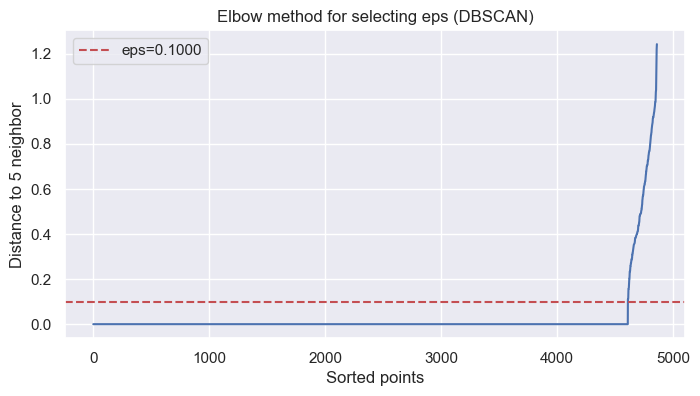

Silhouette score for topic 1: 1.0000
Topic 1, Cluster 0: Diameter = 0.0000
Topic 1, Cluster 1: Diameter = 0.0000
Topic 1, Cluster 2: Diameter = 0.0000
Topic 1, Cluster 3: Diameter = 0.0000
Topic 1, Cluster 4: Diameter = 6.6476
Topic 1, Cluster 5: Diameter = 6.7595
Topic 1, Cluster 6: Diameter = 6.7706
Topic 1, Cluster 7: Diameter = 6.9934
Topic 1, Cluster 8: Diameter = 4.7643
Topic 1, Cluster 9: Diameter = 0.0000
Topic 1, Cluster 10: Diameter = 2.6262
Topic 1, Cluster 11: Diameter = 5.9239
Topic 1, Cluster 12: Diameter = 4.8398
Topic 1, Cluster 13: Diameter = 4.9865
Topic 1, Cluster 14: Diameter = 0.0000
Topic 1, Cluster 15: Diameter = 2.0041
Topic 1, Cluster 16: Diameter = 0.0000
Topic 1, Cluster 17: Diameter = 1.8295
Topic 1, Cluster 18: Diameter = 0.0000
Topic 1, Cluster 19: Diameter = 6.9427
Topic 1, Cluster 20: Diameter = 2.4948
Topic 1, Cluster 21: Diameter = 2.1892
Topic 1, Cluster 22: Diameter = 2.5168
Topic 1, Cluster 23: Diameter = 0.0000
Topic 1, Cluster 24: Diameter = 1.359

Topic 1, Cluster 0: Diameter = 0.0194
Topic 1, Cluster 1: Diameter = 0.0000
Topic 1, Cluster 2: Diameter = 0.0938
Topic 1, Cluster 3: Diameter = 0.1396
Topic 1, Cluster 4: Diameter = 0.3729
Topic 1, Cluster 5: Diameter = 0.2458
Topic 1, Cluster 6: Diameter = 0.4062
Topic 1, Cluster 7: Diameter = 1.4693
Topic 1, Cluster 8: Diameter = 0.0629
Topic 1, Cluster 9: Diameter = 0.1848
Topic 1, Cluster 10: Diameter = 0.0095
Topic 1, Cluster 11: Diameter = 0.0682
Topic 1, Cluster 12: Diameter = 0.0721
Topic 1, Cluster 13: Diameter = 0.1195
Topic 1, Cluster 14: Diameter = 0.0902
Topic 1, Cluster 15: Diameter = 0.0241
Topic 1, Cluster 16: Diameter = 0.2858
Topic 1, Cluster 17: Diameter = 0.0081
Topic 1, Cluster 18: Diameter = 0.0328
Topic 1, Cluster 19: Diameter = 0.4347
Topic 1, Cluster 20: Diameter = 0.0002
Topic 1, Cluster 21: Diameter = 0.0001
Topic 1, Cluster 22: Diameter = 0.0154
Topic 1, Cluster 23: Diameter = 0.0157
Topic 1, Cluster 24: Diameter = 0.0001
Topic 1, Cluster 25: Diameter = 0.0

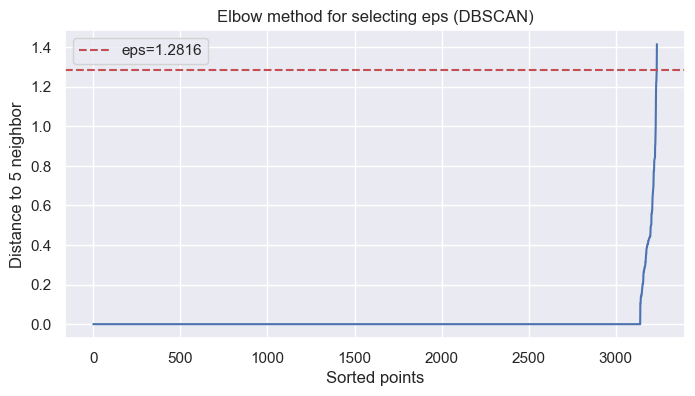

Silhouette score for topic 2: 0.2821
Topic 2, Cluster 0: Diameter = 169.7207
Topic 2, Cluster 1: Diameter = 9.6106
Topic 2, Cluster 2: Diameter = 2.8375
Topic 2, Cluster 3: Diameter = 2.9016


Topic 2, Cluster 0: Diameter = 34.1106
Topic 2, Cluster 1: Diameter = 0.4657
Topic 2, Cluster 2: Diameter = 0.0248
Topic 2, Cluster 3: Diameter = 0.0168


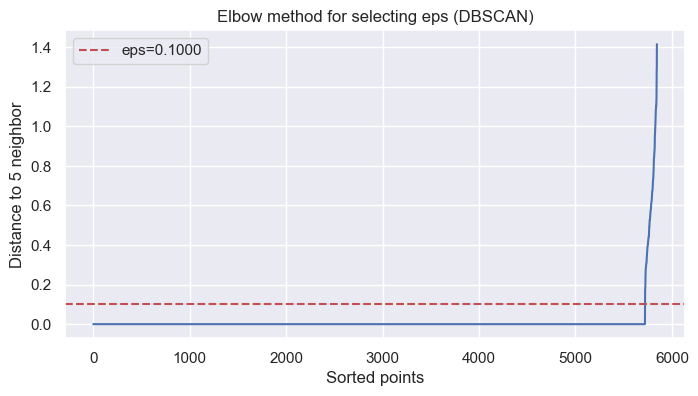

Silhouette score for topic 3: 1.0000
Topic 3, Cluster 0: Diameter = 723.9094
Topic 3, Cluster 1: Diameter = 0.0000
Topic 3, Cluster 2: Diameter = 29.4385
Topic 3, Cluster 3: Diameter = 0.0000
Topic 3, Cluster 4: Diameter = 0.0000
Topic 3, Cluster 5: Diameter = 8.6993
Topic 3, Cluster 6: Diameter = 11.2677
Topic 3, Cluster 7: Diameter = 25.2962
Topic 3, Cluster 8: Diameter = 7.7313
Topic 3, Cluster 9: Diameter = 6.8144
Topic 3, Cluster 10: Diameter = 23.5013
Topic 3, Cluster 11: Diameter = 0.0000
Topic 3, Cluster 12: Diameter = 17.1241
Topic 3, Cluster 13: Diameter = 6.2016
Topic 3, Cluster 14: Diameter = 22.7021
Topic 3, Cluster 15: Diameter = 8.6003
Topic 3, Cluster 16: Diameter = 0.0000
Topic 3, Cluster 17: Diameter = 0.0000
Topic 3, Cluster 18: Diameter = 17.5589
Topic 3, Cluster 19: Diameter = 0.0000
Topic 3, Cluster 20: Diameter = 0.0000
Topic 3, Cluster 21: Diameter = 43.4658
Topic 3, Cluster 22: Diameter = 0.0000
Topic 3, Cluster 23: Diameter = 95.5543
Topic 3, Cluster 24: Diame

Topic 3, Cluster 0: Diameter = 31.9572
Topic 3, Cluster 1: Diameter = 0.0507
Topic 3, Cluster 2: Diameter = 0.7019
Topic 3, Cluster 3: Diameter = 0.0732
Topic 3, Cluster 4: Diameter = 20.4451
Topic 3, Cluster 5: Diameter = 15.6246
Topic 3, Cluster 6: Diameter = 16.3506
Topic 3, Cluster 7: Diameter = 0.8049
Topic 3, Cluster 8: Diameter = 0.0012
Topic 3, Cluster 9: Diameter = 0.7286
Topic 3, Cluster 10: Diameter = 0.1055
Topic 3, Cluster 11: Diameter = 0.0175
Topic 3, Cluster 12: Diameter = 0.1574
Topic 3, Cluster 13: Diameter = 0.0410
Topic 3, Cluster 14: Diameter = 0.1725
Topic 3, Cluster 15: Diameter = 0.0551
Topic 3, Cluster 16: Diameter = 0.0097
Topic 3, Cluster 17: Diameter = 14.8351
Topic 3, Cluster 18: Diameter = 17.6837
Topic 3, Cluster 19: Diameter = 0.0696
Topic 3, Cluster 20: Diameter = 0.0002
Topic 3, Cluster 21: Diameter = 19.3155
Topic 3, Cluster 22: Diameter = 0.0002
Topic 3, Cluster 23: Diameter = 1.1837
Topic 3, Cluster 24: Diameter = 0.0128
Topic 3, Cluster 25: Diamete

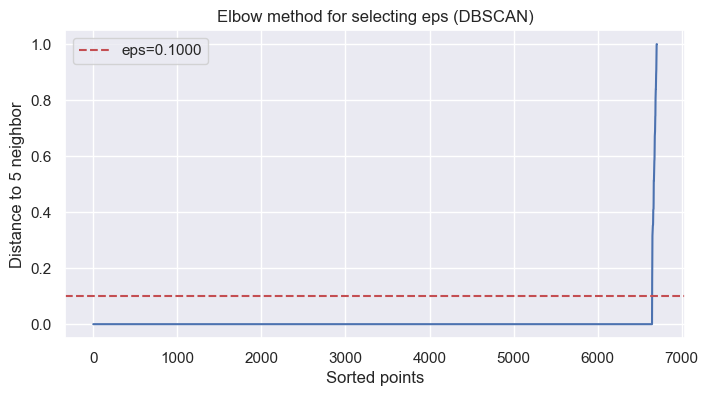

Silhouette score for topic 4: 1.0000
Topic 4, Cluster 0: Diameter = 0.0000
Topic 4, Cluster 1: Diameter = 11297.8799
Topic 4, Cluster 2: Diameter = 0.0000
Topic 4, Cluster 3: Diameter = 8.5594
Topic 4, Cluster 4: Diameter = 171.4297
Topic 4, Cluster 5: Diameter = 0.0000
Topic 4, Cluster 6: Diameter = 3.2279
Topic 4, Cluster 7: Diameter = 9.7637
Topic 4, Cluster 8: Diameter = 2182.1631
Topic 4, Cluster 9: Diameter = 0.0000
Topic 4, Cluster 10: Diameter = 0.0000
Topic 4, Cluster 11: Diameter = 1.9313
Topic 4, Cluster 12: Diameter = 2.4730
Topic 4, Cluster 13: Diameter = 0.0000
Topic 4, Cluster 14: Diameter = 5.3322
Topic 4, Cluster 15: Diameter = 2.4580
Topic 4, Cluster 16: Diameter = 0.0000
Topic 4, Cluster 17: Diameter = 0.0000
Topic 4, Cluster 18: Diameter = 0.0000
Topic 4, Cluster 19: Diameter = 13.6249
Topic 4, Cluster 20: Diameter = 10.0154
Topic 4, Cluster 21: Diameter = 0.0000
Topic 4, Cluster 22: Diameter = 8.6779
Topic 4, Cluster 23: Diameter = 0.0000
Topic 4, Cluster 24: Diame

Topic 4, Cluster 0: Diameter = 0.0631
Topic 4, Cluster 1: Diameter = 26.5002
Topic 4, Cluster 2: Diameter = 7.7413
Topic 4, Cluster 3: Diameter = 0.5051
Topic 4, Cluster 4: Diameter = 20.8790
Topic 4, Cluster 5: Diameter = 0.0149
Topic 4, Cluster 6: Diameter = 0.0470
Topic 4, Cluster 7: Diameter = 7.3310
Topic 4, Cluster 8: Diameter = 28.7282
Topic 4, Cluster 9: Diameter = 5.0219
Topic 4, Cluster 10: Diameter = 0.2662
Topic 4, Cluster 11: Diameter = 4.6452
Topic 4, Cluster 12: Diameter = 0.0001
Topic 4, Cluster 13: Diameter = 0.0009
Topic 4, Cluster 14: Diameter = 0.0675
Topic 4, Cluster 15: Diameter = 0.0005
Topic 4, Cluster 16: Diameter = 0.0001
Topic 4, Cluster 17: Diameter = 3.6358
Topic 4, Cluster 18: Diameter = 0.4391
Topic 4, Cluster 19: Diameter = 16.5503
Topic 4, Cluster 20: Diameter = 15.3135
Topic 4, Cluster 21: Diameter = 0.1663
Topic 4, Cluster 22: Diameter = 0.4834
Topic 4, Cluster 23: Diameter = 0.0006
Topic 4, Cluster 24: Diameter = 0.7339
Topic 4, Cluster 25: Diameter 

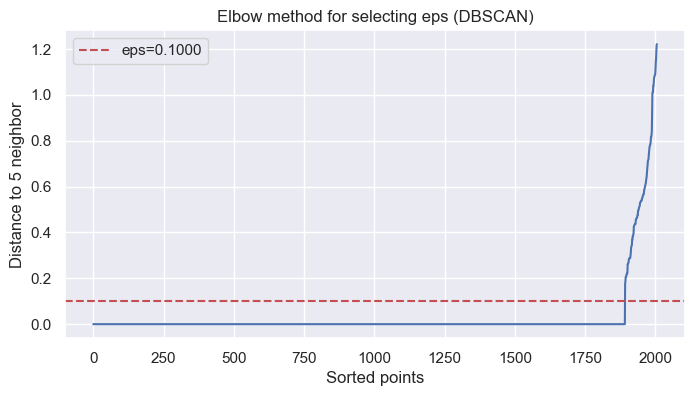

Silhouette score for topic 5: 1.0000
Topic 5, Cluster 0: Diameter = 1.6356
Topic 5, Cluster 1: Diameter = 7.7914
Topic 5, Cluster 2: Diameter = 1.9598
Topic 5, Cluster 3: Diameter = 7.4783
Topic 5, Cluster 4: Diameter = 1.6890
Topic 5, Cluster 5: Diameter = 2.6879
Topic 5, Cluster 6: Diameter = 5.5908
Topic 5, Cluster 7: Diameter = 2.6876
Topic 5, Cluster 8: Diameter = 8.1159
Topic 5, Cluster 9: Diameter = 0.0000
Topic 5, Cluster 10: Diameter = 0.0000
Topic 5, Cluster 11: Diameter = 2.8335
Topic 5, Cluster 12: Diameter = 7.7946
Topic 5, Cluster 13: Diameter = 0.0000
Topic 5, Cluster 14: Diameter = 5.1196
Topic 5, Cluster 15: Diameter = 11.3764
Topic 5, Cluster 16: Diameter = 0.0000
Topic 5, Cluster 17: Diameter = 0.0000
Topic 5, Cluster 18: Diameter = 0.0000
Topic 5, Cluster 19: Diameter = 10.2159
Topic 5, Cluster 20: Diameter = 0.0000
Topic 5, Cluster 21: Diameter = 0.0000
Topic 5, Cluster 22: Diameter = 8.6152
Topic 5, Cluster 23: Diameter = 7.6298
Topic 5, Cluster 24: Diameter = 0.0

Topic 5, Cluster 0: Diameter = 0.0606
Topic 5, Cluster 1: Diameter = 0.2167
Topic 5, Cluster 2: Diameter = 0.0271
Topic 5, Cluster 3: Diameter = 0.1723
Topic 5, Cluster 4: Diameter = 0.0562
Topic 5, Cluster 5: Diameter = 0.0430
Topic 5, Cluster 6: Diameter = 0.1891
Topic 5, Cluster 7: Diameter = 0.0096
Topic 5, Cluster 8: Diameter = 0.5164
Topic 5, Cluster 9: Diameter = 0.0000
Topic 5, Cluster 10: Diameter = 0.0417
Topic 5, Cluster 11: Diameter = 0.1862
Topic 5, Cluster 12: Diameter = 0.1457
Topic 5, Cluster 13: Diameter = 0.0718
Topic 5, Cluster 14: Diameter = 0.0697
Topic 5, Cluster 15: Diameter = 1.4554
Topic 5, Cluster 16: Diameter = 0.3994
Topic 5, Cluster 17: Diameter = 0.0271
Topic 5, Cluster 18: Diameter = 0.0354
Topic 5, Cluster 19: Diameter = 0.7863
Topic 5, Cluster 20: Diameter = 0.1053
Topic 5, Cluster 21: Diameter = 0.0001
Topic 5, Cluster 22: Diameter = 1.1753
Topic 5, Cluster 23: Diameter = 0.3013
Topic 5, Cluster 24: Diameter = 0.3719
Topic 5, Cluster 25: Diameter = 0.0

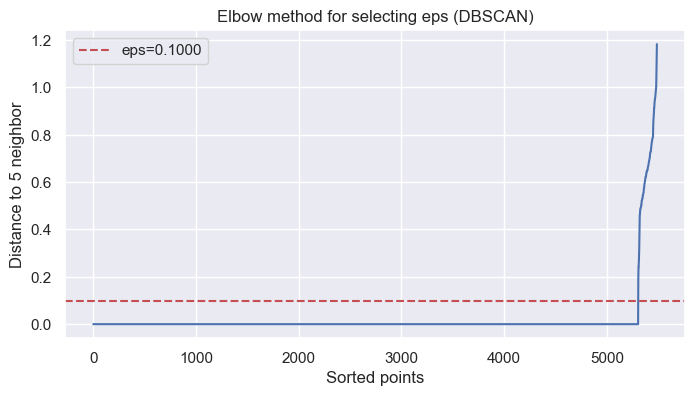

Silhouette score for topic 6: 1.0000
Topic 6, Cluster 0: Diameter = 810.9756
Topic 6, Cluster 1: Diameter = 0.0000
Topic 6, Cluster 2: Diameter = 11.8070
Topic 6, Cluster 3: Diameter = 10.6230
Topic 6, Cluster 4: Diameter = 9.6072
Topic 6, Cluster 5: Diameter = 21.0302
Topic 6, Cluster 6: Diameter = 0.0000
Topic 6, Cluster 7: Diameter = 40.9697
Topic 6, Cluster 8: Diameter = 0.0000
Topic 6, Cluster 9: Diameter = 41.7847


Topic 6, Cluster 0: Diameter = 36.1276
Topic 6, Cluster 1: Diameter = 0.3061
Topic 6, Cluster 2: Diameter = 0.0007
Topic 6, Cluster 3: Diameter = 0.0001
Topic 6, Cluster 4: Diameter = 0.0469
Topic 6, Cluster 5: Diameter = 0.0576
Topic 6, Cluster 6: Diameter = 0.0034
Topic 6, Cluster 7: Diameter = 2.1757
Topic 6, Cluster 8: Diameter = 0.1036
Topic 6, Cluster 9: Diameter = 0.7859


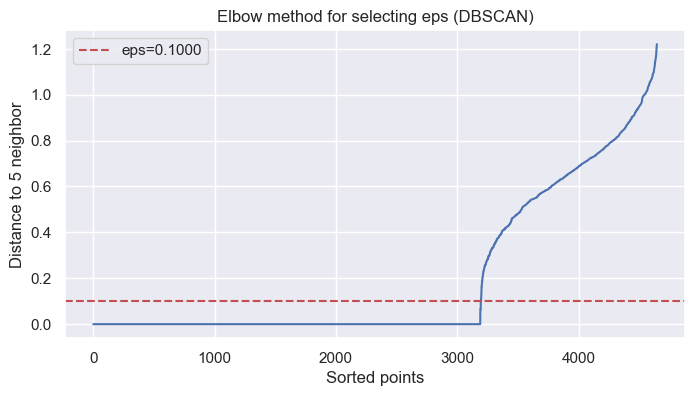

Silhouette score for topic 7: 0.9998
Topic 7, Cluster 0: Diameter = 1.3643
Topic 7, Cluster 1: Diameter = 5.2351
Topic 7, Cluster 2: Diameter = 4.3337
Topic 7, Cluster 3: Diameter = 0.0000
Topic 7, Cluster 4: Diameter = 0.0000
Topic 7, Cluster 5: Diameter = 0.0093
Topic 7, Cluster 6: Diameter = 3.8515
Topic 7, Cluster 7: Diameter = 1.4783
Topic 7, Cluster 8: Diameter = 3.7944
Topic 7, Cluster 9: Diameter = 0.0000
Topic 7, Cluster 10: Diameter = 1.0798
Topic 7, Cluster 11: Diameter = 0.0000
Topic 7, Cluster 12: Diameter = 0.8883
Topic 7, Cluster 13: Diameter = 0.0001
Topic 7, Cluster 14: Diameter = 0.0000
Topic 7, Cluster 15: Diameter = 0.7290
Topic 7, Cluster 16: Diameter = 322.3317
Topic 7, Cluster 17: Diameter = 3.8859
Topic 7, Cluster 18: Diameter = 0.0000
Topic 7, Cluster 19: Diameter = 4.7883
Topic 7, Cluster 20: Diameter = 4.7940
Topic 7, Cluster 21: Diameter = 3.9968
Topic 7, Cluster 22: Diameter = 4.6904
Topic 7, Cluster 23: Diameter = 0.0000
Topic 7, Cluster 24: Diameter = 0.0

Topic 7, Cluster 0: Diameter = 0.0007
Topic 7, Cluster 1: Diameter = 23.6957
Topic 7, Cluster 2: Diameter = 13.3042
Topic 7, Cluster 3: Diameter = 0.0053
Topic 7, Cluster 4: Diameter = 0.0128
Topic 7, Cluster 5: Diameter = 0.0213
Topic 7, Cluster 6: Diameter = 0.3437
Topic 7, Cluster 7: Diameter = 0.0566
Topic 7, Cluster 8: Diameter = 0.6435
Topic 7, Cluster 9: Diameter = 0.1083
Topic 7, Cluster 10: Diameter = 0.0233
Topic 7, Cluster 11: Diameter = 0.0001
Topic 7, Cluster 12: Diameter = 0.0859
Topic 7, Cluster 13: Diameter = 0.0153
Topic 7, Cluster 14: Diameter = 0.0002
Topic 7, Cluster 15: Diameter = 0.0452
Topic 7, Cluster 16: Diameter = 24.1896
Topic 7, Cluster 17: Diameter = 4.3892
Topic 7, Cluster 18: Diameter = 16.3416
Topic 7, Cluster 19: Diameter = 0.5567
Topic 7, Cluster 20: Diameter = 0.8302
Topic 7, Cluster 21: Diameter = 22.4784
Topic 7, Cluster 22: Diameter = 15.1994
Topic 7, Cluster 23: Diameter = 13.1836
Topic 7, Cluster 24: Diameter = 0.0877
Topic 7, Cluster 25: Diamete

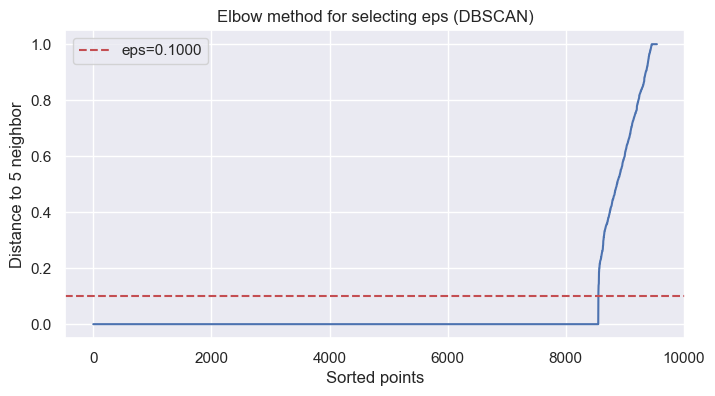

Silhouette score for topic 8: 0.9999
Topic 8, Cluster 0: Diameter = 0.0000
Topic 8, Cluster 1: Diameter = 3.9052
Topic 8, Cluster 2: Diameter = 1.4619
Topic 8, Cluster 3: Diameter = 0.0000
Topic 8, Cluster 4: Diameter = 2.4151
Topic 8, Cluster 5: Diameter = 4.8784
Topic 8, Cluster 6: Diameter = 2.1381
Topic 8, Cluster 7: Diameter = 4.1814
Topic 8, Cluster 8: Diameter = 0.0000
Topic 8, Cluster 9: Diameter = 4.1547
Topic 8, Cluster 10: Diameter = 3.9728
Topic 8, Cluster 11: Diameter = 0.0000
Topic 8, Cluster 12: Diameter = 0.0000
Topic 8, Cluster 13: Diameter = 3.9413
Topic 8, Cluster 14: Diameter = 1.8630
Topic 8, Cluster 15: Diameter = 0.0000
Topic 8, Cluster 16: Diameter = 4.7815
Topic 8, Cluster 17: Diameter = 0.6910
Topic 8, Cluster 18: Diameter = 4.9436
Topic 8, Cluster 19: Diameter = 0.0000
Topic 8, Cluster 20: Diameter = 0.7180
Topic 8, Cluster 21: Diameter = 0.4458
Topic 8, Cluster 22: Diameter = 0.0000
Topic 8, Cluster 23: Diameter = 2.7404
Topic 8, Cluster 24: Diameter = 0.000

Topic 8, Cluster 0: Diameter = 0.0015
Topic 8, Cluster 1: Diameter = 0.1501
Topic 8, Cluster 2: Diameter = 0.1260
Topic 8, Cluster 3: Diameter = 0.0018
Topic 8, Cluster 4: Diameter = 0.2672
Topic 8, Cluster 5: Diameter = 21.2196
Topic 8, Cluster 6: Diameter = 0.0535
Topic 8, Cluster 7: Diameter = 0.8341
Topic 8, Cluster 8: Diameter = 0.0002
Topic 8, Cluster 9: Diameter = 5.5762
Topic 8, Cluster 10: Diameter = 0.1997
Topic 8, Cluster 11: Diameter = 0.0628
Topic 8, Cluster 12: Diameter = 0.0578
Topic 8, Cluster 13: Diameter = 0.1087
Topic 8, Cluster 14: Diameter = 0.1607
Topic 8, Cluster 15: Diameter = 0.0479
Topic 8, Cluster 16: Diameter = 0.0568
Topic 8, Cluster 17: Diameter = 0.0085
Topic 8, Cluster 18: Diameter = 0.8197
Topic 8, Cluster 19: Diameter = 0.0971
Topic 8, Cluster 20: Diameter = 0.0001
Topic 8, Cluster 21: Diameter = 0.0001
Topic 8, Cluster 22: Diameter = 0.0067
Topic 8, Cluster 23: Diameter = 0.3947
Topic 8, Cluster 24: Diameter = 8.4470
Topic 8, Cluster 25: Diameter = 0.

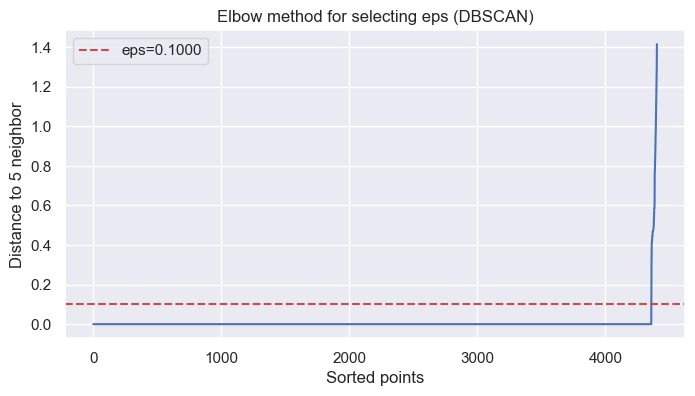

Silhouette score for topic 9: 1.0000
Topic 9, Cluster 0: Diameter = 18.9232
Topic 9, Cluster 1: Diameter = 17.0006
Topic 9, Cluster 2: Diameter = 15594.2617
Topic 9, Cluster 3: Diameter = 20.8710
Topic 9, Cluster 4: Diameter = 1726.3741
Topic 9, Cluster 5: Diameter = 7.6715
Topic 9, Cluster 6: Diameter = 0.0000
Topic 9, Cluster 7: Diameter = 5.0835
Topic 9, Cluster 8: Diameter = 0.0000
Topic 9, Cluster 9: Diameter = 6.2670
Topic 9, Cluster 10: Diameter = 0.0000
Topic 9, Cluster 11: Diameter = 0.0000
Topic 9, Cluster 12: Diameter = 0.0000


Topic 9, Cluster 0: Diameter = 1.5489
Topic 9, Cluster 1: Diameter = 0.1633
Topic 9, Cluster 2: Diameter = 29.7667
Topic 9, Cluster 3: Diameter = 0.6937
Topic 9, Cluster 4: Diameter = 29.3658
Topic 9, Cluster 5: Diameter = 10.4962
Topic 9, Cluster 6: Diameter = 1.8880
Topic 9, Cluster 7: Diameter = 3.9893
Topic 9, Cluster 8: Diameter = 0.0143
Topic 9, Cluster 9: Diameter = 0.0461
Topic 9, Cluster 10: Diameter = 0.0001
Topic 9, Cluster 11: Diameter = 19.8051
Topic 9, Cluster 12: Diameter = 11.1936


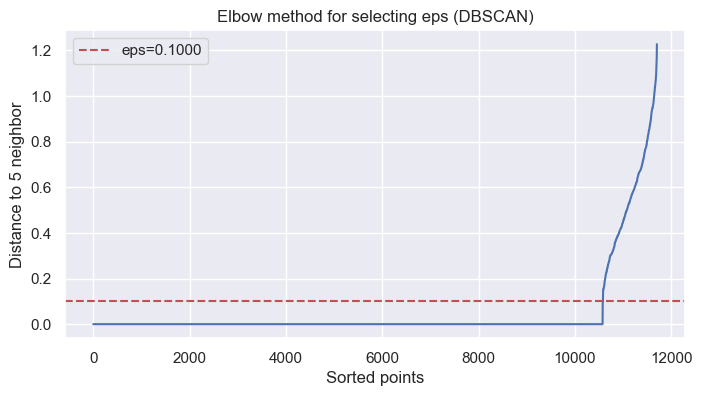

Silhouette score for topic 10: 1.0000
Topic 10, Cluster 0: Diameter = 2.5682
Topic 10, Cluster 1: Diameter = 3.1517
Topic 10, Cluster 2: Diameter = 0.0001
Topic 10, Cluster 3: Diameter = 2.6919
Topic 10, Cluster 4: Diameter = 279.0468
Topic 10, Cluster 5: Diameter = 2.3057
Topic 10, Cluster 6: Diameter = 3.0882
Topic 10, Cluster 7: Diameter = 3.4356
Topic 10, Cluster 8: Diameter = 0.0000
Topic 10, Cluster 9: Diameter = 3.8420
Topic 10, Cluster 10: Diameter = 139.2442
Topic 10, Cluster 11: Diameter = 2.4481
Topic 10, Cluster 12: Diameter = 3.7535
Topic 10, Cluster 13: Diameter = 0.8362
Topic 10, Cluster 14: Diameter = 2.3261
Topic 10, Cluster 15: Diameter = 0.0000
Topic 10, Cluster 16: Diameter = 1.0662
Topic 10, Cluster 17: Diameter = 7.0379
Topic 10, Cluster 18: Diameter = 243.6961
Topic 10, Cluster 19: Diameter = 4.2338
Topic 10, Cluster 20: Diameter = 0.0000
Topic 10, Cluster 21: Diameter = 0.0003
Topic 10, Cluster 22: Diameter = 0.0000
Topic 10, Cluster 23: Diameter = 3.9916
Topic 

Topic 10, Cluster 228: Diameter = 4.2378
Topic 10, Cluster 229: Diameter = 3.5059
Topic 10, Cluster 230: Diameter = 0.0209
Topic 10, Cluster 231: Diameter = 0.0000
Topic 10, Cluster 232: Diameter = 0.0003
Topic 10, Cluster 233: Diameter = 0.0000
Topic 10, Cluster 234: Diameter = 0.0000
Topic 10, Cluster 235: Diameter = 0.0005
Topic 10, Cluster 236: Diameter = 3.7332
Topic 10, Cluster 237: Diameter = 2.2522
Topic 10, Cluster 238: Diameter = 0.0000
Topic 10, Cluster 239: Diameter = 0.0006
Topic 10, Cluster 240: Diameter = 0.0003
Topic 10, Cluster 241: Diameter = 0.0000
Topic 10, Cluster 242: Diameter = 0.0000
Topic 10, Cluster 243: Diameter = 0.0000
Topic 10, Cluster 244: Diameter = 0.0000
Topic 10, Cluster 245: Diameter = 0.0000
Topic 10, Cluster 246: Diameter = 0.0000
Topic 10, Cluster 247: Diameter = 0.0000
Topic 10, Cluster 248: Diameter = 0.0000
Topic 10, Cluster 249: Diameter = 0.0005
Topic 10, Cluster 250: Diameter = 2.3933
Topic 10, Cluster 251: Diameter = 2.3861
Topic 10, Cluste

Topic 10, Cluster 0: Diameter = 0.6297
Topic 10, Cluster 1: Diameter = 0.2996
Topic 10, Cluster 2: Diameter = 0.0005
Topic 10, Cluster 3: Diameter = 0.6158
Topic 10, Cluster 4: Diameter = 15.0243
Topic 10, Cluster 5: Diameter = 0.1352
Topic 10, Cluster 6: Diameter = 0.1160
Topic 10, Cluster 7: Diameter = 5.0443
Topic 10, Cluster 8: Diameter = 0.0214
Topic 10, Cluster 9: Diameter = 6.4069
Topic 10, Cluster 10: Diameter = 14.3452
Topic 10, Cluster 11: Diameter = 0.2120
Topic 10, Cluster 12: Diameter = 4.3734
Topic 10, Cluster 13: Diameter = 2.4512
Topic 10, Cluster 14: Diameter = 0.0715
Topic 10, Cluster 15: Diameter = 0.0032
Topic 10, Cluster 16: Diameter = 0.0008
Topic 10, Cluster 17: Diameter = 5.1220
Topic 10, Cluster 18: Diameter = 0.9380
Topic 10, Cluster 19: Diameter = 12.3832
Topic 10, Cluster 20: Diameter = 0.0007
Topic 10, Cluster 21: Diameter = 0.0050
Topic 10, Cluster 22: Diameter = 0.0018
Topic 10, Cluster 23: Diameter = 0.8296
Topic 10, Cluster 24: Diameter = 0.0312
Topic 1

Topic 10, Cluster 228: Diameter = 17.4750
Topic 10, Cluster 229: Diameter = 18.0623
Topic 10, Cluster 230: Diameter = 0.0962
Topic 10, Cluster 231: Diameter = 0.0005
Topic 10, Cluster 232: Diameter = 0.0012
Topic 10, Cluster 233: Diameter = 0.0010
Topic 10, Cluster 234: Diameter = 0.0169
Topic 10, Cluster 235: Diameter = 0.0072
Topic 10, Cluster 236: Diameter = 1.0862
Topic 10, Cluster 237: Diameter = 0.2658
Topic 10, Cluster 238: Diameter = 0.0005
Topic 10, Cluster 239: Diameter = 0.0109
Topic 10, Cluster 240: Diameter = 0.0351
Topic 10, Cluster 241: Diameter = 0.0441
Topic 10, Cluster 242: Diameter = 0.0008
Topic 10, Cluster 243: Diameter = 0.0238
Topic 10, Cluster 244: Diameter = 0.0597
Topic 10, Cluster 245: Diameter = 0.0075
Topic 10, Cluster 246: Diameter = 0.0015
Topic 10, Cluster 247: Diameter = 0.0854
Topic 10, Cluster 248: Diameter = 0.0002
Topic 10, Cluster 249: Diameter = 0.0006
Topic 10, Cluster 250: Diameter = 0.5099
Topic 10, Cluster 251: Diameter = 0.5122
Topic 10, Clus

In [24]:
# # Clustering and visualization
for topic_id in range(num_topics):
    result = cluster_within_topic(data, topic_id, global_tfidf_matrix=tfidf_matrix)
    if result:
        tfidf_matrix_topic, cluster_labels, topic_df = result
        data.loc[topic_df.index, f'cluster_topic_{topic_id}'] = cluster_labels
        
        # Visualization with t-SNE
        visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="tsne")
        # Visualization with UMAP
        visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="umap")
    else:
        print(f"It is impossible to cluster for topic {topic_id}. Check the number of records.")

In [32]:
#Diary + sport
data[data['cluster_topic_2']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация коррекция вес снижение избыточный масса тело',
       'режим нагрузка общий рекомендация измерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самоконтроль',
       'ведение дневник снижение вес',
       'отмечать положительный эффект фон терапия психотропный препарат',
       'режим нагрузка общий рекомендация аэробный физический нагрузка быстрый ходьба км час мина ежедневно пульс мин плавние элипс веллотренажер закаливание обливание контрастный душ подъём вес кг',
       'режим нагрузка общий рекомендация контроль ад пульс утро приём терапия вечер аэробный физический нагрузка быстрый ходьба км час мина ежедневно пульс мин плавание элипс веллотренажер закаливание обливание контрастный душ подъём вес кг',
       'режим нагрузка общий рекомендация контроль ад пульс утро приём терапия вечер сон аэробный физический нагрузка быстрый ходьба 

In [33]:
data[data['cluster_topic_2']==1]['processed_text'].unique()

array(['настоящий время существовать эффективный препарат помощь которых бросить курить'],
      dtype=object)

In [34]:
data[data['cluster_topic_2']==2]['processed_text'].unique()

array(['назначить препарат принимать ежедневно пропуск выходной желательный иметь запасный блистер работа машина',
       'принимать внимаение признак диастолической гипертензия дневник давление смена терапия комбинированный нолипрел отмена'],
      dtype=object)

In [35]:
data[data['cluster_topic_2']==3]['processed_text'].unique()

array(['занятие спорт любительский уровень',
       'занятие спорт плавание противопоказано',
       'занятие любительский спорт противопоказано',
       'освобождение занятие физический культура спорт'], dtype=object)

1. самоконтроль ад занесение данных измерение дневник повторный визит врач принести дневник минимум день
2. контроль ад пульс вести дневник

In [37]:
data[data['cluster_topic_8']==81]['processed_text'].unique()

array(['самоконтроль ад занесение данных измерение дневник повторный визит врач принести дневник минимум день'],
      dtype=object)

In [38]:
data[data['cluster_topic_8']==108]['processed_text'].unique()

array(['прогулка контроль ад', 'контроль ад прогулка'], dtype=object)

In [39]:
data[data['cluster_topic_8']==116]['processed_text'].unique()

array(['контроль ад пульс вести дневник'], dtype=object)

In [30]:
data[data['cluster_topic_8']==69]['processed_text'].unique()

array(['контроль пульс ад ведение дневник',
       'контроль ад пульс ведение дневник'], dtype=object)

In [43]:
data[data['cluster_topic_8']==73]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль ад пульс утро завтрак вечер сон мина покой',
       'режим нагрузка общий рекомендация контроль ад пульс утро завтрак вечер сон мина покой справа',
       'режим нагрузка общий рекомендация контроль ад пульс утро завтрак вечер сон мина покой право плече'],
      dtype=object)

In [44]:
data[data['cluster_topic_8']==48]['processed_text'].unique()

array(['контроль ад пульс', 'контроль пульс ад',
       'контроль пульс ад контроль пульс ад'], dtype=object)

In [31]:
#Sport
data[data['cluster_topic_3']==0]['processed_text'].unique()

array(['дозированные физический нагрузка ходьба утренний гимнастика регулярный аэробный упражнение физический активность менее мина ежедневно контроль общий самочувствие'],
      dtype=object)